## This notebook will be mainly used for the capstone project.

In [2]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

print ("Hello Capstone Project Course!")

Hello Capstone Project Course!


In [3]:
# The code was removed by Watson Studio for sharing.

/opt/conda/envs/Python36/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (33) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [4]:
df_collisions[ df_collisions['ROADCOND'].isnull()]['INCKEY'].count()
print ( "empty X: ", df_collisions[ df_collisions['X'].isnull()]['INCKEY'].count() )
print ( "empty Y: ", df_collisions[ df_collisions['Y'].isnull()]['INCKEY'].count() )

df_col = df_collisions[df_collisions['X'].notna()]
print ( "empty X: ", df_col[ df_col['X'].isnull()]['INCKEY'].count() )
print ( "empty Y: ", df_col[ df_col['Y'].isnull()]['INCKEY'].count() )


empty X:  5334
empty Y:  5334
empty X:  0
empty Y:  0


In [5]:
df_col = df_col[['X', 'Y', 'INCKEY', 'LOCATION', 'SEVERITYCODE', 'SEVERITYDESC', 'COLLISIONTYPE', 'PERSONCOUNT', 'PEDCOUNT', 'PEDCYLCOUNT', 'VEHCOUNT', 'INCDATE', 'INCDTTM', 'JUNCTIONTYPE', 'SDOT_COLCODE', 'SDOT_COLDESC', 'INATTENTIONIND', 'UNDERINFL', 'WEATHER', 'ROADCOND', 'LIGHTCOND', 'PEDROWNOTGRNT', 'SDOTCOLNUM', 'SPEEDING', 'ST_COLCODE', 'ST_COLDESC', 'SEGLANEKEY', 'CROSSWALKKEY', 'HITPARKEDCAR']]
df_col.describe(include=['object'])

,LOCATION,SEVERITYDESC,COLLISIONTYPE,INCDATE,INCDTTM,JUNCTIONTYPE,SDOT_COLDESC,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING,ST_COLCODE,ST_COLDESC,HITPARKEDCAR
count,189339,189339,184582,189339,189339,185146,189339,29176,184602,184414,184481,184327,4645,8720,189321,184582,189339
unique,23890,2,10,5985,157960,7,39,1,4,11,9,9,1,1,115,62,2
top,N NORTHGATE WAY BETWEEN MERIDIAN AVE N AND COR...,Property Damage Only Collision,Parked Car,2006/11/02 00:00:00+00,11/2/2006,Mid-Block (not related to intersection),"MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END ...",Y,N,Clear,Dry,Daylight,Y,Y,32,One parked--one moving,N
freq,265,132221,46381,88,88,87390,84538,29176,97639,108959,122076,113582,4645,8720,26650,42869,182334


In [83]:
#!conda install -c conda-forge folium=0.5.0 --yes

In [84]:
import folium

In [6]:
df_col = df_col.astype({"ST_COLDESC": str})

In [86]:
from folium import plugins

latitude = 47.621275
longitude = -122.329026

# replace NaN in descritpions with ""  to add labels on the map
df_col.replace (np.nan, "")

df_col_lim = df_col.iloc[0:10000, :]
# map of Seattle
seattle_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(seattle_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df_col_lim.Y, df_col_lim.X, df_col_lim.ST_COLDESC):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# display map
seattle_map

In [87]:
from folium.plugins import FastMarkerCluster

st_lat = 47.621275
st_lng = -122.329026

# init the folium map object
st_map = folium.Map(location=[st_lat, st_lng], zoom_start=12)

# add all the point from the file to the map object using FastMarkerCluster
#st_map.add_child(FastMarkerCluster(df_col[['X', 'Y']].values.tolist()))

FastMarkerCluster (data = list(zip( df_col['Y'].values, df_col['X'].values ))).add_to(st_map)

folium.LayerControl().add_to(st_map)


# save the map 
# st_map.save("save_file.html")
st_map

In [7]:
# create dataframe with coordinates of places where more than 10 accidents occurred
df_top_places_coord = df_col[['X', 'Y', 'INCKEY']].groupby(['X','Y'], as_index = False).count()
df_top_places_coord.sort_values (by = 'INCKEY', ascending = False, inplace = True)
#df_top_places_coord = df_top_places_coord[df_top_places_coord['INCKEY'] > 10]
df_top_places_coord.iloc[0:50, :]
df_top_places_coord['INCKEY'].astype(str)

11258    265
8807     254
12221    252
8779     239
18966    231
7621     212
8348     190
8657     161
11299    160
23144    152
16494    146
20720    142
10758    138
9912     136
13750    136
10578    133
18298    132
13031    131
23157    130
9838     129
22495    128
15051    128
11024    128
13390    126
10738    125
11757    124
21148    121
12315    121
11899    119
21296    118
        ... 
11917      1
11928      1
11943      1
11959      1
11890      1
11974      1
11989      1
11992      1
11993      1
12000      1
12018      1
11892      1
11889      1
11771      1
11825      1
11777      1
11793      1
11799      1
11801      1
11804      1
11805      1
11832      1
11871      1
11838      1
11841      1
11842      1
11848      1
11856      1
11865      1
11942      1
Name: INCKEY, Length: 23884, dtype: object

In [89]:
from folium import plugins
from folium.features import DivIcon

latitude = 47.621275
longitude = -122.329026

# replace NaN in descritpions with ""  to add labels on the map
df_col.replace (np.nan, "")

df_col_lim = df_top_places_coord.iloc[0:10, :]
# map of Seattle
seattle_map = folium.Map(location = [latitude, longitude], zoom_start = 11)

# instantiate a mark cluster object for the incidents in the dataframe
#incidents = plugins.MarkerCluster().add_to(seattle_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df_col_lim.Y, df_col_lim.X, df_col_lim.INCKEY.astype(str)):
    folium.features.CircleMarker(
        [lat, lng],
        radius = 7, # define how big you want the circle markers to be
        color = 'yellow',
        fill = True,
        popup = label,
        fill_color = 'red',
        fill_opacity = 0.6
    ).add_to(seattle_map)
    folium.map.Marker(
        [lat, lng],
        icon = DivIcon(
            icon_size=(150,36),
            icon_anchor=(0,0),
            html='<div style="font-size: 9pt"><b>%s</b></div>' % label,
        )
    ).add_to(seattle_map)

# display map
seattle_map

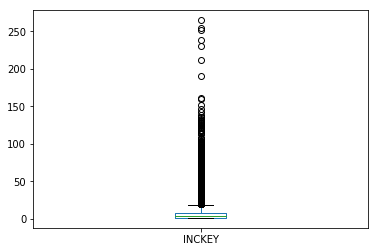

In [90]:
df_top_places_coord.plot.box (y = 'INCKEY')
plt.show()

In [8]:
# check the number of coolisions by date to see the trend.
df_collisions['INCDATE'] = pd.to_datetime( df_collisions['INCDATE'], format = '%Y/%m/%d' )
df_col_by_date = pd.DataFrame ( df_collisions.groupby ( df_collisions['INCDATE'].dt.year.astype(str) + '-' +
                                         df_collisions['INCDATE'].dt.month.astype(str).apply( lambda x: x.zfill(2) ) ) ['INCKEY'].count() )
df_col_by_date.reset_index(inplace = True)
df_col_by_date.columns = ('Month', 'incnum')


import time
df_col_by_date['time'] = pd.to_datetime( df_col_by_date['Month'], format = '%Y-%m' )
#time.mktime(df_col_by_date.Month.timetuple())
df_col_by_date['time'] = df_col_by_date['time'].apply ( lambda x: time.mktime ( x.timetuple() ) ) 
df_col_by_date.head ()

,Month,incnum,time
0,2004-01,976,1.072915e+09
1,2004-02,893,1.075594e+09
2,2004-03,1030,1.078099e+09
3,2004-04,1053,1.080778e+09
4,2004-05,1148,1.083370e+09


Text(0, 0.5, 'Number of incidents in a month')

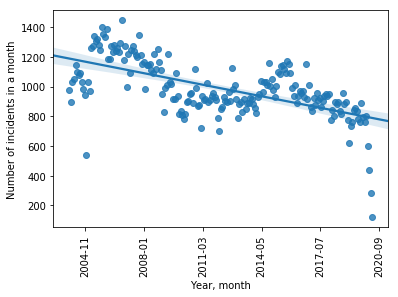

In [92]:
#df_col_by_date['Month'] = pd.to_datetime( df_col_by_date['Month'] + '-01', format = '%Y-%m-%d' )
import seaborn as sns
ax = sns.regplot (x = 'time', y = 'incnum', data = df_col_by_date )

xlabels  = pd.Series( ax.get_xticks() ).apply( lambda x: str(time.localtime(x)[0]) + '-' + str( time.localtime(x)[1]).zfill(2) ) 
ax.set_xticklabels ( xlabels, rotation = 90)
ax.set_xlabel ('Year, month')
ax.set_ylabel ('Number of incidents in a month')

            4             3             2
-2.789e-31 x + 1.476e-21 x - 2.912e-12 x + 0.00254 x - 8.248e+05
The R-square value is:  0.6520871583304824


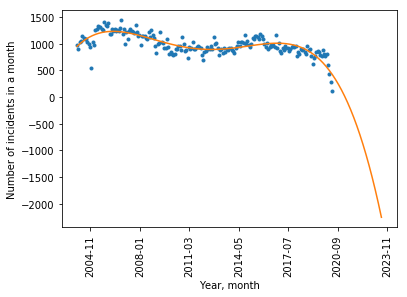

In [93]:
x = df_col_by_date['time']
y = df_col_by_date['incnum']

# Here we use a polynomial of the different orders
f = np.polyfit(x, y, 4)
p = np.poly1d(f)
print(p)

from sklearn.metrics import r2_score
r_squared = r2_score( y, p(x) )
print('The R-square value is: ', r_squared)

x_new = np.linspace(df_col_by_date['time'].min(), df_col_by_date['time'].max() + 100000000, 100)
y_new = p(x_new)
plt.plot(x, y, '.', x_new, y_new, '-')
ax = plt.gca()
xlabels  = pd.Series( ax.get_xticks() ).apply( lambda x: str(time.localtime(x)[0]) + '-' + str( time.localtime(x)[1]).zfill(2) ) 
ax.set_xticklabels ( xlabels, rotation = 90)
ax.set_xlabel ('Year, month')
ax.set_ylabel ('Number of incidents in a month')
plt.show()



#### Determine how weather condition affect the number of incidents in a certain day. Find out the dates, where the number of inicidents with particular weather conditions were at maximum levels:
    1. Fog/Smog/Smoke 	
    2. Raining
    3. Sleet/Hail/Freezing Rain
    4. Snowing

In [66]:
# Check how a given attribute with specific condition contributes to the number of inicidents.
def weather_cond_test (condattr, condstr):
    df_test= df_collisions.loc[ df_collisions[condattr] == condstr ]
    df_test= pd.DataFrame ( df_test.groupby ( df_test['strdate'] ) ['INCKEY'].count() )

    df_test.sort_values (by = 'INCKEY', ascending = False, inplace = True)

    df_test.columns = [condstr]
    df_test.reset_index (inplace = True)

    df_test['strmonth'] = df_test['strdate'].apply (lambda x: x[0:7])

    df_test= pd.merge ( df_test, df_collisions.groupby ( by = 'strdate' ) ['INCKEY'].count(), how = 'inner', on = 'strdate')
    df_test.rename (columns = {'INCKEY': 'day_total'}, inplace = True)

    df_test= pd.merge (df_test, df_collisions.groupby( by = 'strmonth' )['INCKEY'].count()/30, how = 'inner', on = 'strmonth')
    df_test.rename (columns = {'INCKEY': 'month_average'}, inplace = True)

    df_test.sort_values (by = condstr, ascending = False, inplace = True)
    #df_col_fog.head()

    df_test_chart = df_test[['strdate', condstr, 'day_total']][df_test[condstr] > 1]
    df_test_chart['day_total'] = df_test_chart['day_total'] - df_test_chart[condstr]
    
    #print ("DF test: ",df_test_chart.head(20))

    #ax = df_test_chart.plot.bar (x = 'strdate', y = [condstr, 'day_total'], stacked = True, figsize = (25, 5))
    #ax = df_test[['strdate', condstr, 'day_total']][df_test[condstr] > 1].plot.bar (x = 'strdate', stacked = True, figsize = (25, 5))
    
    ax.legend(['Number of incidents with ' + condstr, 'Total number of incidents in a day'])
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False) # labels along the bottom edge are off

    plt.title ('Number of incindents dependence on ' + condstr)
    plt.ylabel ('Number of incidents during a day')
    plt.xlabel ('Days')
    plt.show()
    
    print ('Correlation of ' + condstr + ' with total amount of incidents during a day and average daily amount of incidents in a given month')
    print (df_test[['strdate', condstr, 'day_total', 'month_average']].corr()[[condstr]])
    
    
    sns.regplot (x = condstr, y = 'day_total', data = df_test)
    plt.title ('Number of incindents dependence on ' + condstr)
    plt.ylabel ('Number of incidents during a day')
    plt.xlabel ('Number of incidents during a day with ' + condstr)

In [77]:
# Check how a given attribute with specific condition contributes to the number of inicidents. Group by months
def cond_test_month (condattr, condstr):
    df_test= df_collisions.loc[ df_collisions[condattr] == condstr ]
    df_test= pd.DataFrame ( df_test.groupby ( df_test['strmonth'] ) ['INCKEY'].count() )

    df_test.sort_values (by = 'INCKEY', ascending = False, inplace = True)

    df_test.columns = [condstr]
    df_test.reset_index (inplace = True)

    #df_test['strmonth'] = df_test['strdate'].apply (lambda x: x[0:7])

    df_test= pd.merge ( df_test, df_collisions.groupby ( by = 'strmonth' ) ['INCKEY'].count(), how = 'inner', on = 'strmonth')
    df_test.rename (columns = {'INCKEY': 'month_total'}, inplace = True)

    df_test= pd.merge (df_test, df_collisions.groupby( by = 'strmonth' )['INCKEY'].count()/30, how = 'inner', on = 'strmonth')
    df_test.rename (columns = {'INCKEY': 'month_average'}, inplace = True)

    df_test.sort_values (by = condstr, ascending = False, inplace = True)
    #df_col_fog.head()

    df_test_chart = df_test[['strmonth', condstr, 'month_total']][df_test[condstr] > 1]
    df_test_chart['month_total'] = df_test_chart['month_total'] - df_test_chart[condstr]
    
    #print ("DF test: ",df_test_chart.head(20))

    ax = df_test_chart.plot.bar (x = 'strmonth', y = [condstr, 'month_total'], stacked = True, figsize = (25, 5))
    #ax = df_test[['strdate', condstr, 'day_total']][df_test[condstr] > 1].plot.bar (x = 'strdate', stacked = True, figsize = (25, 5))
    
    ax.legend(['Number of incidents with ' + condstr, 'Total number of incidents in a month'])
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False) # labels along the bottom edge are off

    plt.title ('Number of incindents dependence on ' + condstr)
    plt.ylabel ('Number of incidents during the month')
    plt.xlabel ('Months')
    plt.show()
    
    print ('Correlation of ' + condstr + ' with total amount of incidents during the month')
    print (df_test[['strmonth', condstr, 'month_total', 'month_average']].corr()[[condstr]])
    
    
    sns.regplot (x = condstr, y = 'month_total', data = df_test)
    plt.title ('Number of incindents dependence on ' + condstr)
    plt.ylabel ('Number of incidents during the month')
    plt.xlabel ('Number of incidents during a month with ' + condstr)

#### 1. Fog/Smog/Smoke

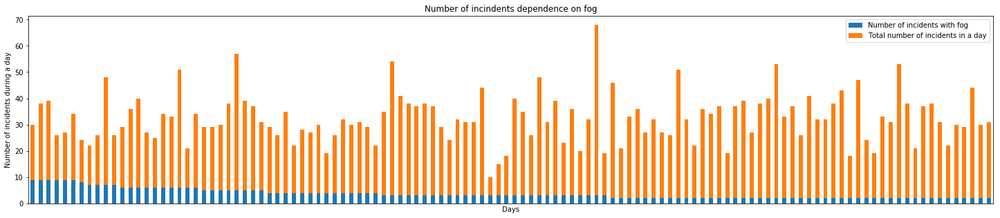

In [12]:
df_collisions['strmonth'] = ( df_collisions['INCDATE'].dt.year.astype(str) + '-' + 
                            df_collisions['INCDATE'].dt.month.astype(str).apply( lambda x: x.zfill(2) )
                           )

df_collisions['strdate'] = ( df_collisions['strmonth'] + '-' + 
                            df_collisions['INCDATE'].dt.day.astype(str).apply( lambda x: x.zfill(2) )
                           )

df_col_fog = df_collisions.loc[ df_collisions['WEATHER'] == 'Fog/Smog/Smoke' ]
df_col_fog = pd.DataFrame ( df_col_fog.groupby ( df_col_fog['strdate'] ) ['INCKEY'].count() )
#df_col_fog.reset_index (inplace = True)

#df_col_by_date.reset_index(inplace = True)
#df_col_by_date.columns = ('Month', 'incnum')
df_col_fog.sort_values (by = 'INCKEY', ascending = False, inplace = True)


#df_col_fog = df_collisions.loc [ df_collisions.groupby ]
#df_collisions.head()
df_col_fog.columns = ['numfog']
df_col_fog.reset_index (inplace = True)
#df_col_fog['total'] = df_collisions[ df_collisions[['strdate']] == df_col_fog[['strdate']] ]

df_col_fog['strmonth'] = df_col_fog['strdate'].apply (lambda x: x[0:7])
df_col_fog.head()


df_col_fog = pd.merge ( df_col_fog, df_collisions.groupby ( by = 'strdate' ) ['INCKEY'].count(), how = 'inner', on = 'strdate')
df_col_fog.rename (columns = {'INCKEY': 'day_total'}, inplace = True)
df_col_fog = pd.merge (df_col_fog, df_collisions.groupby( by = 'strmonth' )['INCKEY'].count()/30, how = 'inner', on = 'strmonth')
df_col_fog.rename (columns = {'INCKEY': 'month_average'}, inplace = True)

df_col_fog.sort_values (by = 'numfog', ascending = False, inplace = True)
#df_col_fog.head()

df_col_fog_chart = df_col_fog[['strdate', 'numfog', 'day_total', 'month_average']][df_col_fog['numfog'] > 1]
df_col_fog_chart['day_total'] = df_col_fog_chart['day_total'] - df_col_fog_chart['numfog']

ax = df_col_fog_chart[['strdate', 'numfog', 'day_total']].plot.bar (x = 'strdate', stacked = True, figsize = (25, 5))

ax.legend(['Number of incidents with fog', 'Total number of incidents in a day'])

plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
plt.title ('Number of incindents dependence on fog')
plt.ylabel ('Number of incidents during a day')
plt.xlabel ('Days')

plt.show()

In [96]:
df_col_fog[['strdate', 'numfog', 'day_total', 'month_average']].corr()[['numfog']]

,numfog
numfog,1.000000
day_total,-0.039717
month_average,-0.045658


In [11]:
df_col_fog.head()

NameError: name 'df_col_fog' is not defined

Text(0.5, 0, 'Number of incidents during a day with fog')

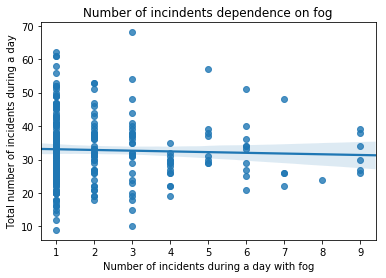

In [98]:
sns.regplot (x = 'numfog', y = 'day_total', data = df_col_fog)
plt.title ('Number of incindents dependence on fog')
plt.ylabel ('Total number of incidents during a day')
plt.xlabel ('Number of incidents during a day with fog')

#### 2. Raining

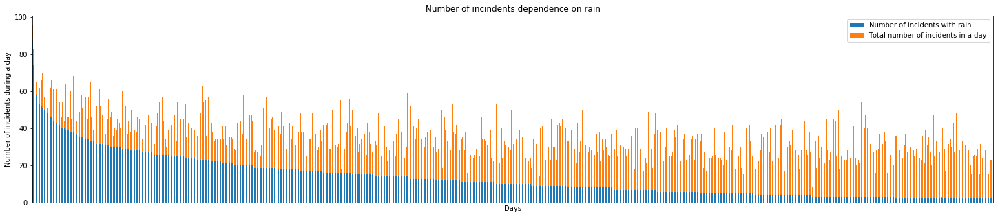

In [99]:
df_col_rain = df_collisions.loc[ df_collisions['WEATHER'] == 'Raining' ]
df_col_rain = pd.DataFrame ( df_col_rain.groupby ( df_col_rain['strdate'] ) ['INCKEY'].count() )

df_col_rain.sort_values (by = 'INCKEY', ascending = False, inplace = True)

df_col_rain.columns = ['numrain']
df_col_rain.reset_index (inplace = True)

df_col_rain['strmonth'] = df_col_rain['strdate'].apply (lambda x: x[0:7])

df_col_rain = pd.merge ( df_col_rain, df_collisions.groupby ( by = 'strdate' ) ['INCKEY'].count(), how = 'inner', on = 'strdate')
df_col_rain.rename (columns = {'INCKEY': 'day_total'}, inplace = True)

df_col_rain = pd.merge (df_col_rain, df_collisions.groupby( by = 'strmonth' )['INCKEY'].count()/30, how = 'inner', on = 'strmonth')
df_col_rain.rename (columns = {'INCKEY': 'month_average'}, inplace = True)

df_col_rain.sort_values (by = 'numrain', ascending = False, inplace = True)
#df_col_fog.head()

df_col_rain_chart = df_col_rain[['strdate', 'numrain', 'day_total']][df_col_rain['numrain'] > 1]
df_col_rain_chart['day_total'] = df_col_rain_chart['day_total'] - df_col_rain_chart['numrain']

ax = df_col_rain_chart.plot.bar (x = 'strdate', stacked = True, figsize = (25, 5))
#ax = df_col_rain[['strdate', 'numrain', 'day_total']][df_col_rain['numrain'] > 1].plot.bar (x = 'strdate', stacked = True, figsize = (25, 5))

ax.legend(['Number of incidents with rain', 'Total number of incidents in a day'])
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

plt.title ('Number of incindents dependence on rain')
plt.ylabel ('Number of incidents during a day')
plt.xlabel ('Days')
plt.show()

In [100]:
df_col_rain[['strdate', 'numrain', 'day_total', 'month_average']].corr()[['numrain']]

,numrain
numrain,1.000000
day_total,0.647928
month_average,0.203968


Text(0.5, 0, 'Number of incidents during a day with rain')

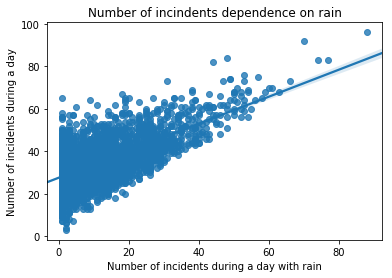

In [101]:
sns.regplot (x = 'numrain', y = 'day_total', data = df_col_rain)
plt.title ('Number of incindents dependence on rain')
plt.ylabel ('Number of incidents during a day')
plt.xlabel ('Number of incidents during a day with rain')

#### 3. Sleet/Hail/Freezing Rain

DF test:         strdate  Sleet/Hail/Freezing Rain  day_total
0   2005-01-15                         9         23
4   2017-02-27                         5         44
6   2009-02-09                         4         32
8   2012-01-19                         4         20
10  2004-01-02                         3         61
12  2008-04-18                         3         56
14  2013-04-13                         3         37
16  2006-11-29                         2         34
40  2020-01-13                         2         10
36  2009-01-25                         2         22
34  2007-01-16                         2         60
28  2007-12-02                         2         34
26  2008-01-14                         2         48
22  2011-02-22                         2         36
19  2009-03-07                         2         26
39  2016-01-03                         2         21
15  2006-11-26                         2         13
9   2012-01-17                         2         18


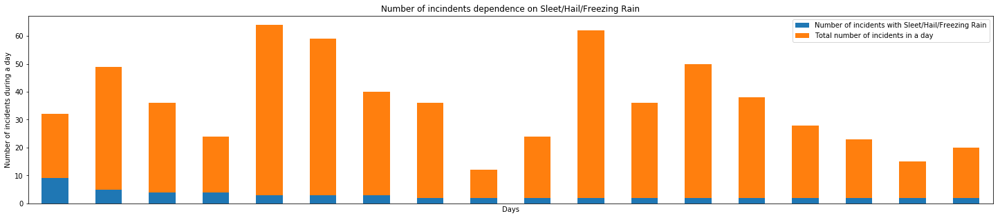

Correlation of Sleet/Hail/Freezing Rain with total amount of incidents during a day and average daily amount of incidents in a given month
                          Sleet/Hail/Freezing Rain
Sleet/Hail/Freezing Rain                  1.000000
day_total                                 0.062614
month_average                            -0.083432


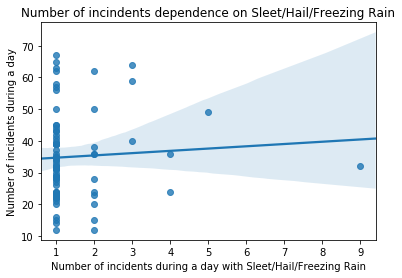

In [122]:
weather_cond_test ('WEATHER', 'Sleet/Hail/Freezing Rain')

#### 4. Snowing

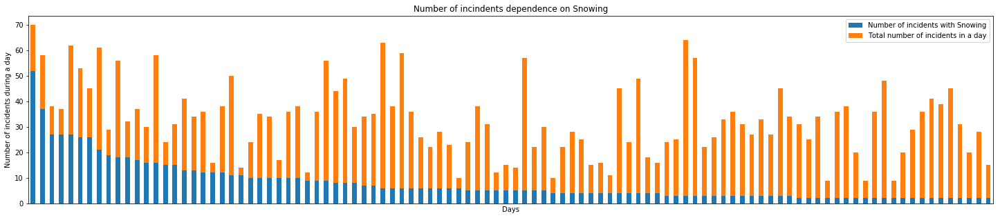

Correlation of Snowing with total amount of incidents during a day and average daily amount of incidents in a given month
                Snowing
Snowing        1.000000
day_total      0.232555
month_average -0.001782


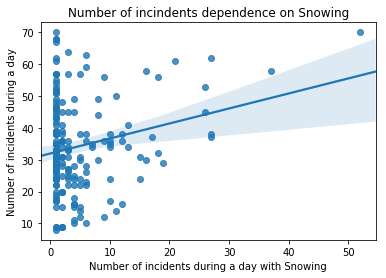

In [103]:
weather_cond_test ('WEATHER', 'Snowing')

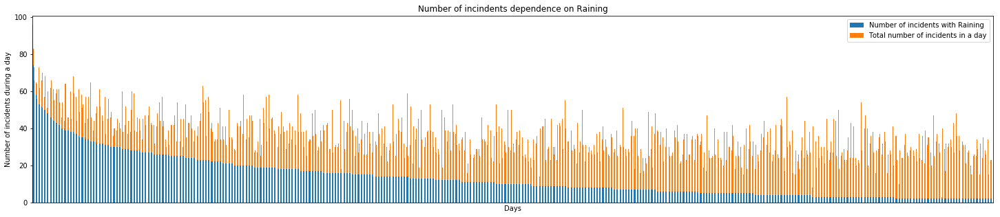

Correlation of Raining with total amount of incidents during a day and average daily amount of incidents in a given month
                Raining
Raining        1.000000
day_total      0.647928
month_average  0.203968


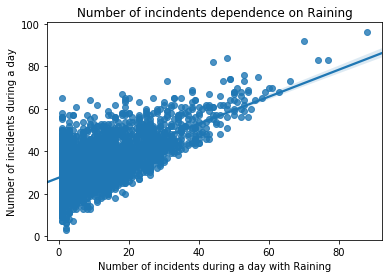

In [104]:
weather_cond_test ('WEATHER', 'Raining')

#### 5. Road conditions
    5.1 Dry
    5.2 Wet
    5.3 Ice
    5.4 Snow/Slush
    5.5 Standing Water
    5.6 Sand/Mud/Dirt
    5.7 Oil

#### 5.2 Wet

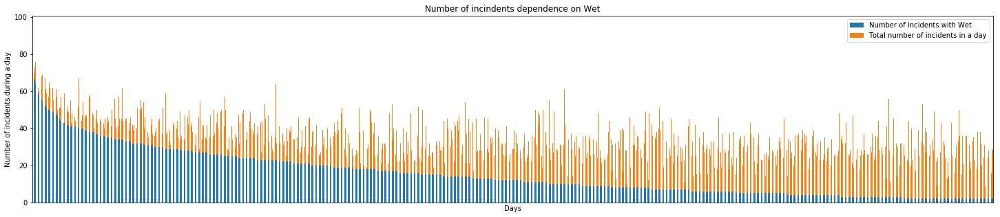

Correlation of Wet with total amount of incidents during a day and average daily amount of incidents in a given month
                    Wet
Wet            1.000000
day_total      0.632734
month_average  0.197534


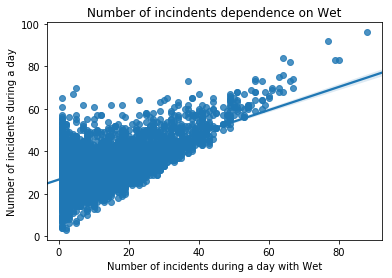

In [105]:
weather_cond_test ('ROADCOND', 'Wet')

#### 5.3 Ice

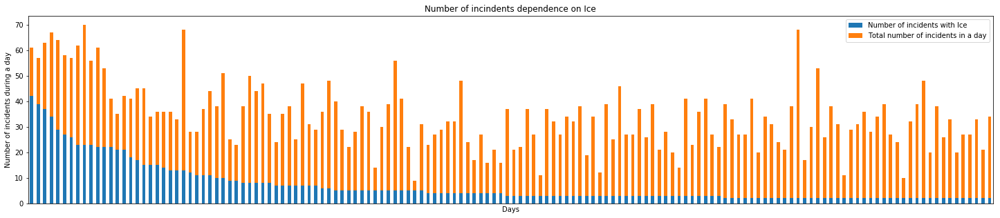

Correlation of Ice with total amount of incidents during a day and average daily amount of incidents in a given month
                    Ice
Ice            1.000000
day_total      0.463025
month_average  0.207659


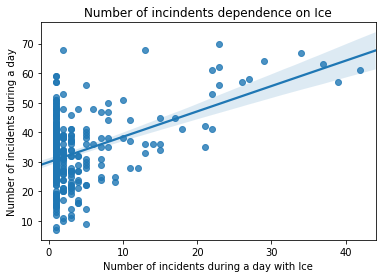

In [106]:
weather_cond_test ('ROADCOND', 'Ice')

#### 5.4 Snow/Slush

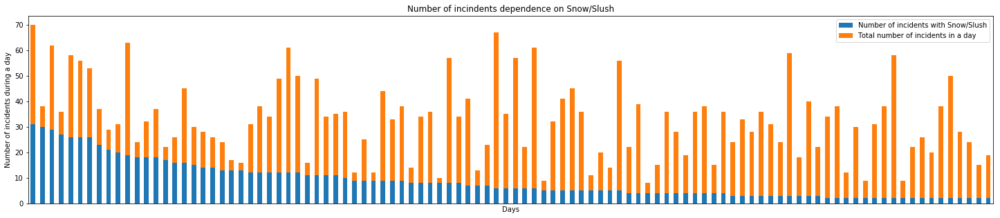

Correlation of Snow/Slush with total amount of incidents during a day and average daily amount of incidents in a given month
               Snow/Slush
Snow/Slush       1.000000
day_total        0.103414
month_average    0.004492


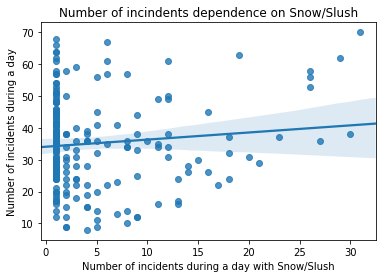

In [107]:
weather_cond_test ('ROADCOND', 'Snow/Slush')

#### 5.5 Standing Water

DF test:         strdate  Standing Water  day_total
0   2009-04-17               2         47
5   2005-05-19               2         51
10  2006-01-29               2         39
7   2007-12-02               2         34
16  2015-12-09               2         38
4   2005-11-04               2         67
3   2005-12-24               2         42
2   2012-03-31               2         27


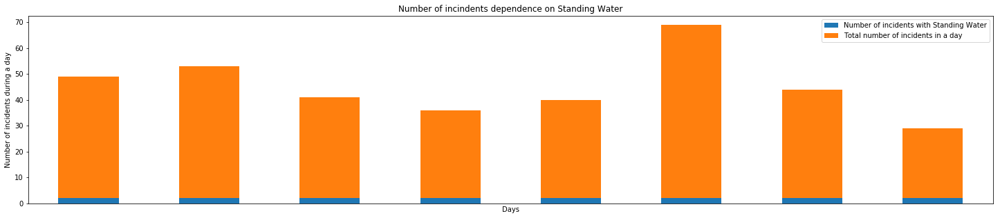

Correlation of Standing Water with total amount of incidents during a day and average daily amount of incidents in a given month
                Standing Water
Standing Water        1.000000
day_total             0.086631
month_average         0.192585


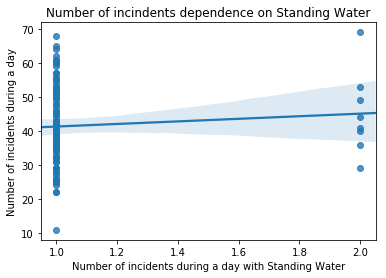

In [119]:
weather_cond_test ('ROADCOND', 'Standing Water')

#### 5.7 Oil

DF test:        strdate  Oil  day_total
0  2019-09-24    2         32
1  2018-10-08    2         42


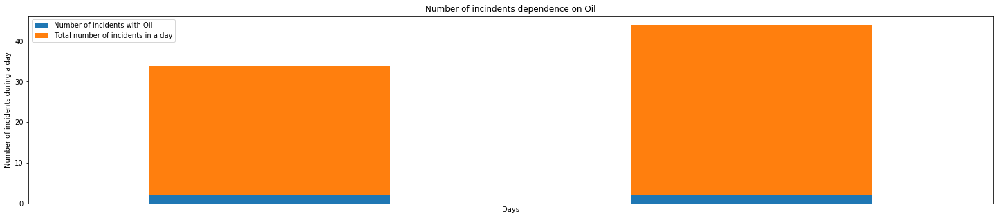

Correlation of Oil with total amount of incidents during a day and average daily amount of incidents in a given month
                    Oil
Oil            1.000000
day_total     -0.026733
month_average -0.224966


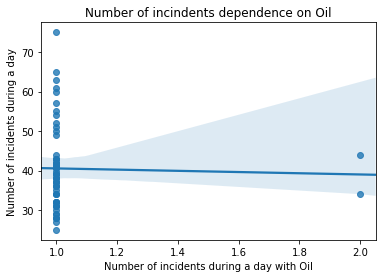

In [118]:
weather_cond_test ('ROADCOND', 'Oil')

#### 7. Light conditions
    7.1 Daylight
    7.2 Dark - Street Lights On
    7.3 Dusk
    7.4 Dawn
    7.5 Dark - No Street Lights
    7.6 Dark - Street Lights Off


#### 7.1 Dark - Street Lights On

In [62]:
#weather_cond_test ('LIGHTCOND', 'Dusk')
df_col_lights = df_collisions[[ 'LIGHTCOND', 'INCKEY', 'strmonth']].groupby (['strmonth', 'LIGHTCOND'], as_index = False).count()
df_col_totatl_mon = df_collisions[[ 'INCKEY', 'strmonth']].groupby (['strmonth'], as_index = False).count()
#df_collisions[[ 'LIGHTCOND', 'INCKEY', 'strmonth']]

df_col_lights = df_col_lights.pivot(index='strmonth',columns='LIGHTCOND')
df_col_lights.columns = df_col_lights.columns.droplevel()
df_col_lights.drop(['Unknown', 'Other', 'Dark - Unknown Lighting'], axis = 'columns', inplace = True)
#'Dark - Unknown Lighting', 
#df_col_lights.columns = df_col_lights.columns.droplevel()
df_col_lights_tot = pd.merge ( df_col_lights, df_col_totatl_mon, how = 'inner', on = 'strmonth')

df_col_lights_tot.rename (columns = {'INCKEY': 'Total number of collisions'}, inplace = True)
df_col_lights_tot.corr()[['Total number of collisions']].sort_values (by = 'Total number of collisions', ascending = False)
#df_col_lights_tot.head(10)

,Total number of collisions
Total number of collisions,1.000000
Dusk,0.726853
Daylight,0.717462
Dark - Street Lights On,0.417451
Dawn,0.402899
Dark - No Street Lights,0.393712
Dark - Street Lights Off,0.307687


Correlation of Dusk with total amount of incidents during a day and average daily amount of incidents in a given month
                   Dusk
Dusk           1.000000
day_total      0.320841
month_average  0.204922


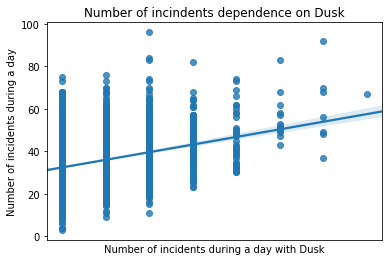

In [68]:
import seaborn as sns
weather_cond_test ('LIGHTCOND', 'Dusk')

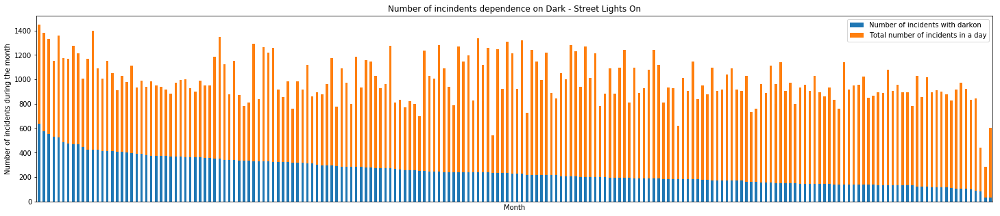

In [74]:
df_col_darkon = df_collisions.loc[ df_collisions['LIGHTCOND'] == 'Dark - Street Lights On' ]
df_col_darkon = pd.DataFrame ( df_col_darkon.groupby ( df_col_darkon['strmonth'] ) ['INCKEY'].count() )

df_col_darkon.sort_values (by = 'INCKEY', ascending = False, inplace = True)

df_col_darkon.columns = ['numdarkon']
df_col_darkon.reset_index (inplace = True)

#df_col_darkon['strmonth'] = df_col_darkon['strdate'].apply (lambda x: x[0:7])

df_col_darkon = pd.merge ( df_col_darkon, df_collisions.groupby ( by = 'strmonth' ) ['INCKEY'].count(), how = 'inner', on = 'strmonth')
df_col_darkon.rename (columns = {'INCKEY': 'day_total'}, inplace = True)

df_col_darkon = pd.merge (df_col_darkon, df_collisions.groupby( by = 'strmonth' )['INCKEY'].count()/30, how = 'inner', on = 'strmonth')
df_col_darkon.rename (columns = {'INCKEY': 'month_average'}, inplace = True)

df_col_darkon.sort_values (by = 'numdarkon', ascending = False, inplace = True)
#df_col_fog.head()

df_col_darkon_chart = df_col_darkon[['strmonth', 'numdarkon', 'day_total']][df_col_darkon['numdarkon'] > 10]
df_col_darkon_chart['day_total'] = df_col_darkon_chart['day_total'] - df_col_darkon_chart['numdarkon']

ax = df_col_darkon_chart.plot.bar (x = 'strmonth', stacked = True,  figsize = (25, 5))

ax.legend(['Number of incidents with darkon', 'Total number of incidents in a day'])
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

plt.title ('Number of incindents dependence on Dark - Street Lights On')
plt.ylabel ('Number of incidents during the month')
plt.xlabel ('Month')
plt.show()
#df_col_darkon_chart


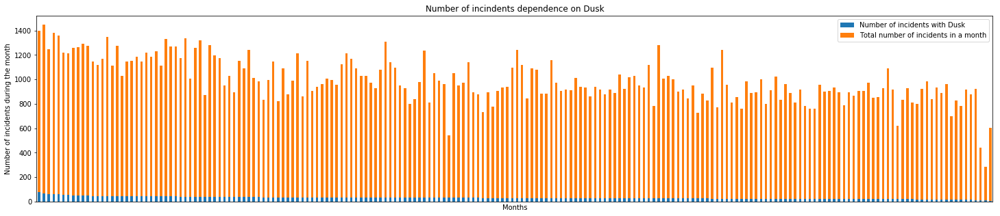

Correlation of Dusk with total amount of incidents during the month
                   Dusk
Dusk           1.000000
month_total    0.726853
month_average  0.726853


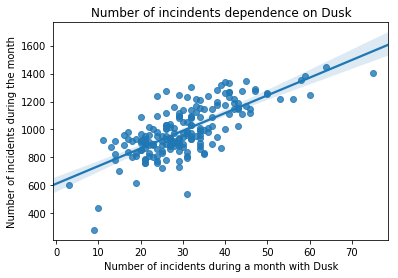

In [78]:
cond_test_month ('LIGHTCOND', 'Dusk')

#### 7 Checking correlation of different conditions with the number of incidents during a day

In [111]:
df_inc_nums = df_collisions[['strdate', 'WEATHER', 'INCKEY']].groupby (by = ['strdate', 'WEATHER'], as_index = False).count ()
df_inc_nums.pivot(columns = 'WEATHER', values = 'INCKEY')
df_inc_nums.head(15)
#df_collisions.columns

,strdate,WEATHER,INCKEY
0,2004-01-01,Clear,3
1,2004-01-01,Overcast,8
2,2004-01-01,Raining,9
3,2004-01-01,Snowing,4
4,2004-01-01,Unknown,1
5,2004-01-02,Clear,16
6,2004-01-02,Overcast,30
7,2004-01-02,Raining,9
8,2004-01-02,Sleet/Hail/Freezing Rain,3
9,2004-01-02,Snowing,3


In [112]:
# add location 

#df_loc_names.reset_index ( inplace = True)
#df_top_places_coord.reset_index ( inplace = True)
#df_top_places_coord.drop (['index'], axis = 1, inplace = True)

# get location name for each X, Y coordinate

df_loc_names = df_col[['X', 'Y', 'LOCATION']].drop_duplicates(subset = ['X', 'Y'])

df_loc_names.set_index (['X', 'Y'], inplace = True)
df_top_places_coord.set_index (['X', 'Y'], inplace = True)

df_top_places_data = pd.merge( df_loc_names, df_top_places_coord, 
                                left_index = True,
                              right_index = True,
                                how = 'inner',
                              validate = "one_to_one"
                             )
print (df_top_places_coord.head())
df_top_places_data.reset_index( inplace = True )
df_top_places_data.rename ( columns = {'INCKEY': "inc_num"}, inplace = True )

                       INCKEY
X           Y                
-122.332653 47.708655     265
-122.344896 47.717173     254
-122.328079 47.604161     252
-122.344997 47.725036     239
-122.299160 47.579673     231


In [ ]:
#df_top_places_data['inc_num'] = df_top_places_data['inc_num'].astype (str)
df_top_places_data.sort_values ( by = 'inc_num', inplace = True, ascending = False )
df_top_places_data = df_top_places_data.iloc[0:50]

df_top_places_data.sort_values( by = 'inc_num' ).plot.barh( x = 'LOCATION', y = 'inc_num', figsize = (7, 10), legend = None )
plt.title ('Top 50 locations where the most number of accidents was reported')
plt.xlabel ('Number of accidents')

plt.show()


In [ ]:
df_top_places = pd.DataFrame(df_col.iloc[0:0])

df_top_places_coord.reset_index (inplace = True)
#for x, y in df_top_places_coord[['X', 'Y']].values:
#        df_top_places = df_top_places.append( 
#            df_col[ (df_col['X'] == x) & (df_col['Y'] == y) ],
#            ignore_index = True )

df_top_places

In [ ]:
df_top_places.to_csv ('top_places.csv')

from project_lib import Project
project = Project( "", "aafac36c-58f4-4a11-8c05-21acabfe3b46","p-a80f6da3f8a403b3be827803052abdf55c6450af")

#project.save_data(file_name = "top_places.csv", data = df_top_places.to_csv(index=False))

In [ ]:
#from folium import plugins
df_
# map of Seattle
st_top_map = folium.Map(location = [st_lat, st_lng], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(seattle_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df_top_places.Y, df_top_places.X, df_top_places.ST_COLDESC):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# display map
st_top_map

In [ ]:
df_col.head()

In [ ]:

body = client_5ce6ac756ad142ccb72a01980ae51ec3.get_object(Bucket='datasciencecapstone-donotdelete-pr-ajuqjizdxwwzr6',Key='top_places.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_top_places = pd.read_csv(body)
df_top_places.head()


In [ ]:
df_roadcond_top = df_top_places[['INCKEY', 'SEVERITYCODE', 'ROADCOND']].groupby(['ROADCOND', 'SEVERITYCODE'], as_index = False).count()
df_roadcond_top.rename (columns = {'SEVERITYCODE': 'Severity', 'INCKEY': 'Top'}, inplace = True )
df_roadcond_top = df_roadcond_top.pivot(index='ROADCOND',columns='Severity')
df_roadcond_top.columns = ['Sev1_top', 'Sev2_top']
#df_roadcond_top['Top'] = df_roadcond_top['Top'] / df_roadcond_top['Top'].sum()* 100
df_roadcond_top = df_roadcond_top / df_top_places['INCKEY'].count()* 100
df_roadcond_top

In [ ]:
df_roadcond_all = df_col[['INCKEY', 'SEVERITYCODE', 'ROADCOND']].groupby(['ROADCOND', 'SEVERITYCODE'], as_index = False).count()
df_roadcond_all.rename (columns = {'SEVERITYCODE': 'Severity', 'INCKEY': 'All'}, inplace = True)
#df_roadcond_all['All'] = df_roadcond_all['All'] / df_roadcond_all['All'].sum()* 100
df_roadcond_all = df_roadcond_all.pivot(index='ROADCOND',columns='Severity')
df_roadcond_all.columns = ['Sev1_all', 'Sev2_all']

print ("df_col total: ", df_col['INCKEY'].count())
print ("df_roadcond_all total: ", df_roadcond_all.sum())
df_roadcond_all = df_roadcond_all / df_col['INCKEY'].count() * 100

df_roadcond_all

In [ ]:
df_roadcond = pd.concat( [df_roadcond_all, df_roadcond_top], axis = 1 )
df_roadcond

In [ ]:
df_roadcond = pd.concat( [df_roadcond_all, df_roadcond_top], axis = 1 )
cond_order = ['Dry', 'Wet', 'Unknown', 'Ice', 'Snow/Slush', 'Other', 'Standing Water', 'Sand/Mud/Dirt', 'Oil' ]
df_roadcond.reindex (cond_order)
#df_roadcond

In [ ]:

df_roadcond_all.reindex (cond_order).plot.bar (figsize = (10,5))
plt.title ('Severity 1 and 2 accidents depending on road conditions')
plt.ylabel ('Percentage of accidents occurred due to a certain road condition')
plt.xlabel ('Road conditions')
plt.legend (['Severity 1 accidents', 'Severity 2 accidents'])

plt.show()

Study dependency of the number of collisions on the weather conditions.

In [ ]:
df_weathercond_all = df_col[['INCKEY', 'SEVERITYCODE', 'WEATHER']].groupby(['WEATHER', 'SEVERITYCODE'], as_index = False).count()
df_weathercond_all.rename (columns = {'SEVERITYCODE': 'Severity', 'INCKEY': 'All'}, inplace = True)
#df_roadcond_all['All'] = df_roadcond_all['All'] / df_roadcond_all['All'].sum()* 100
df_weathercond_all = df_weathercond_all.pivot(index='WEATHER',columns='Severity')
df_weathercond_all.columns = ['Sev1_all', 'Sev2_all']

print ("df_col total: ", df_col['INCKEY'].count())
print ("df_weathercond_all total: ", df_weathercond_all.sum())
df_weathercond_all = df_weathercond_all / df_col['INCKEY'].count() * 100

df_weathercond_all

In [ ]:
cond_order = ['Clear', 'Raining', 'Overcast', 'Unknown', 'Snowing', 'Other', 'Fog/Smog/Smoke', 'Sleet/Hail/Freezing Rain', 'Blowing Sand/Dirt', 'Severe Crosswind', 'Partly Cloudy']
df_weathercond_all.reindex (cond_order).plot.bar (figsize = (10,5))
plt.title ('Severity 1 and 2 accidents depending on weather conditions')
plt.ylabel ('Percentage of accidents occurred due to a certain weather condition')
plt.xlabel ('Weather conditions')
plt.legend (['Severity 1 accidents', 'Severity 2 accidents'])

plt.show()

In [ ]:
df_lightcond_all = df_col[['INCKEY', 'SEVERITYCODE', 'LIGHTCOND']].groupby(['LIGHTCOND', 'SEVERITYCODE'], as_index = False).count()
df_lightcond_all.rename (columns = {'SEVERITYCODE': 'Severity', 'INCKEY': 'All'}, inplace = True)
#df_roadcond_all['All'] = df_roadcond_all['All'] / df_roadcond_all['All'].sum()* 100
df_lightcond_all = df_lightcond_all.pivot(index='LIGHTCOND',columns='Severity')
df_lightcond_all.columns = ['Sev1_all', 'Sev2_all']

print ("df_col total: ", df_col['INCKEY'].count())
print ("df_lightcond_all total: ", df_lightcond_all.sum())
df_lightcond_all = df_lightcond_all / df_col['INCKEY'].count() * 100

df_lightcond_all